## **Restaurant Recommender System in India the Place Chennai**



**Import the file**

In [ ]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from bs4 import BeautifulSoup # library to parse HTML and XML documents

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

print("Libraries imported.")

Libraries imported.


In [ ]:
from google.colab import files
uploaded=files.upload()

Saving Chennai DB.csv to Chennai DB (3).csv


In [ ]:
import io

**Reading the file**

In [ ]:
df = pd.read_csv(io.BytesIO(uploaded['Chennai DB.csv']))

**View the Data set**

In [ ]:
df

,Unnamed: 0,Borough,Neighborhoods,Latitude,Longitude,Population,City,AverageIncome
0,0,South and East Chennai,Adambakkam,12.98800,80.20470,82848,Chennai,18944.099792
1,1,South and East Chennai,Adyar,13.00120,80.25650,147143,Chennai,56837.022198
2,2,South and East Chennai,Alandur,12.99750,80.20060,47983,Chennai,41991.817435
3,3,West Chennai,Alapakkam,13.04900,80.16730,527874,Chennai,6667.447632
4,4,West Chennai,Alwarthirunagar,13.04260,80.18400,893629,Chennai,53270.063892
5,5,West Chennai,Ambattur,13.11430,80.15480,730999,Chennai,50712.430215
6,6,West Chennai,Aminjikarai,13.06980,80.22450,981362,Chennai,60967.535874
7,7,West Chennai,Anna Nagar,13.08500,80.21010,662625,Chennai,59943.541564
8,8,West Chennai,Annanur,13.11840,80.12460,396862,Chennai,58407.090338
9,9,West Chennai,Arumbakkam,13.07240,80.21020,77836,Chennai,55850.962099


In [ ]:
df.head(10)

,Unnamed: 0,Borough,Neighborhoods,Latitude,Longitude,Population,City,AverageIncome
0,0,South and East Chennai,Adambakkam,12.9880,80.2047,82848,Chennai,18944.099792
1,1,South and East Chennai,Adyar,13.0012,80.2565,147143,Chennai,56837.022198
2,2,South and East Chennai,Alandur,12.9975,80.2006,47983,Chennai,41991.817435
3,3,West Chennai,Alapakkam,13.0490,80.1673,527874,Chennai,6667.447632
4,4,West Chennai,Alwarthirunagar,13.0426,80.1840,893629,Chennai,53270.063892
5,5,West Chennai,Ambattur,13.1143,80.1548,730999,Chennai,50712.430215
6,6,West Chennai,Aminjikarai,13.0698,80.2245,981362,Chennai,60967.535874
7,7,West Chennai,Anna Nagar,13.0850,80.2101,662625,Chennai,59943.541564
8,8,West Chennai,Annanur,13.1184,80.1246,396862,Chennai,58407.090338
9,9,West Chennai,Arumbakkam,13.0724,80.2102,77836,Chennai,55850.962099


In [ ]:
df.drop('Unnamed: 0',axis=1,inplace=True)

**Creating 'Population' and 'Income' dataframe from the main dataframe**

In [ ]:
Chennai_population = pd.DataFrame(df[['Borough','Neighborhoods','Population']])

In [ ]:
Chennai_population.head()

,Borough,Neighborhoods,Population
0,South and East Chennai,Adambakkam,82848
1,South and East Chennai,Adyar,147143
2,South and East Chennai,Alandur,47983
3,West Chennai,Alapakkam,527874
4,West Chennai,Alwarthirunagar,893629


In [ ]:
Chennai_population.to_csv('population_dataset.csv')

In [ ]:
Chennai_income = pd.DataFrame(df[['Borough','Neighborhoods','AverageIncome']])

In [ ]:
Chennai_income.head()

,Borough,Neighborhoods,AverageIncome
0,South and East Chennai,Adambakkam,18944.099792
1,South and East Chennai,Adyar,56837.022198
2,South and East Chennai,Alandur,41991.817435
3,West Chennai,Alapakkam,6667.447632
4,West Chennai,Alwarthirunagar,53270.063892


In [ ]:
Chennai_income.to_csv('income_dataset.csv')

In [ ]:
Chennai_income.head()

,Borough,Neighborhoods,AverageIncome
0,South and East Chennai,Adambakkam,18944.099792
1,South and East Chennai,Adyar,56837.022198
2,South and East Chennai,Alandur,41991.817435
3,West Chennai,Alapakkam,6667.447632
4,West Chennai,Alwarthirunagar,53270.063892


In [ ]:
Chennai_latitude = df['Latitude'].mean()
Chennai_longitude = df['Longitude'].mean()
print("Latitude and Longitude of Chennai are : ",Chennai_latitude,Chennai_longitude)

Latitude and Longitude of Chennai are :  13.088371420454548 80.15080056818182


In [ ]:
CLIENT_ID = 'ZA1LQAYVND2ZIXWOO2A1SXWATDCZ2MLO11CAPEYPWO1PAX14'
CLIENT_SECRET = 'HMFJZIV0JAGR13RFSUMJKSUMAQHMQXJAAVQQVHCK15BKHXRN'
VERSION = '20180606'
LIMIT = 150

In [ ]:
unique_boroughs_of_Chennai = df['Borough'].unique().tolist()

In [ ]:
unique_boroughs_of_Chennai

['South and East Chennai',
 'West Chennai',
 'North Chennai',
 'Besant Nagar',
 'Broadway',
 'north North Chennai',
 'Suburban Chennai',
 'Northern Suburbs of Chennai',
 'Western Suburbs of Chennai',
 'Southern-Eastern Suburbs of Chennai',
 'Suburbs along ECR and OMR of Chennai']

In [ ]:
borough_colors ={}
for i in unique_boroughs_of_Chennai:
    borough_colors[i] = '#%02X%02X%02X' % tuple(np.random.choice(range(256),size=3))

In [ ]:
borough_colors

{'Besant Nagar': '#6AFEA4',
 'Broadway': '#029C02',
 'North Chennai': '#A325DC',
 'Northern Suburbs of Chennai': '#AADEAF',
 'South and East Chennai': '#4DCF52',
 'Southern-Eastern Suburbs of Chennai': '#E4CE88',
 'Suburban Chennai': '#079785',
 'Suburbs along ECR and OMR of Chennai': '#F89A9F',
 'West Chennai': '#3D715A',
 'Western Suburbs of Chennai': '#826065',
 'north North Chennai': '#94DDE8'}

In [ ]:
Chennai_map = folium.Map(location=[Chennai_latitude,Chennai_longitude],zoom_start=12,control_scale=True)

In [ ]:
for lat,lng,boro,nei in zip(df['Latitude'],
                           df['Longitude'],
                           df['Borough'],
                           df['Neighborhoods']):
    label_text = boro + ' - ' + nei
    label = folium.Popup(label_text,parse_html=True)
    folium.CircleMarker(
    [lat,lng],
    tooltip = label_text,
    radius = 4,
    popup = label,
    color=borough_colors[boro],
    fill=True,
    fill_color = borough_colors[boro],
    fill_opacity=0.7).add_to(Chennai_map)

In [ ]:
Chennai_map

**Exploring Chennai Neighborhoods using FourSquare API**

In [ ]:
def getNearbyVenues(names, boro, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, boro, lat, lng in zip(names, boro, latitudes, longitudes):
        print("Fetching venues for : ",name)            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            boro,
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood',
                             'Borough',
                             'Neighborhood Latitude', 
                             'Neighborhood Longitude', 
                             'Venue', 
                             'Venue Latitude', 
                             'Venue Longitude', 
                             'Venue Category']
    
    return(nearby_venues)

In [ ]:
Chennai_venues = getNearbyVenues(boro=df['Borough'],latitudes=df['Latitude'],longitudes=df['Longitude'],names=df['Neighborhoods'])

Fetching venues for :  Adambakkam
Fetching venues for :  Adyar
Fetching venues for :  Alandur
Fetching venues for :  Alapakkam
Fetching venues for :  Alwarthirunagar
Fetching venues for :  Ambattur
Fetching venues for :  Aminjikarai
Fetching venues for :  Anna Nagar
Fetching venues for :  Annanur
Fetching venues for :  Arumbakkam
Fetching venues for :  Ashok Nagar
Fetching venues for :  Avadi
Fetching venues for :  Ayappakkam
Fetching venues for :  Basin Bridge
Fetching venues for :  South and East Chennai
Fetching venues for :  North Chennai
Fetching venues for :  Central
Fetching venues for :  Chetpet
Fetching venues for :  Choolai
Fetching venues for :  MMDA Colony
Fetching venues for :  Defence Colony
Fetching venues for :  Egmore
Fetching venues for :  Ennore
Fetching venues for :  Erukanchery
Fetching venues for :  George Town
Fetching venues for :  Gerugambakkam
Fetching venues for :  Gopalapuram
Fetching venues for :  Guindy
Fetching venues for :  Hastinapuram
Fetching venues f

In [ ]:
print("Total number of venues found in Chennai are : ",Chennai_venues.shape[0])

Total number of venues found in Chennai are :  887


In [ ]:
Chennai_venues.head(5)

,Neighborhood,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Adambakkam,South and East Chennai,12.9880,80.2047,Venkateshwara Super Market,12.986320,80.205168,Department Store
1,Adambakkam,South and East Chennai,12.9880,80.2047,Ibaco,12.988729,80.205646,Dessert Shop
2,Adambakkam,South and East Chennai,12.9880,80.2047,Deepam Restaurant,12.985380,80.205281,Indian Restaurant
3,Adambakkam,South and East Chennai,12.9880,80.2047,ibaco Adambakkam,12.987358,80.200504,Ice Cream Shop
4,Adyar,South and East Chennai,13.0012,80.2565,Zha Cafe,12.999730,80.254806,Café


In [ ]:
Chennai_venues.groupby('Venue Category').count()['Neighborhood'].sort_values(ascending=False).head(10)

Venue Category
Indian Restaurant                120
Café                              33
Fast Food Restaurant              32
Vegetarian / Vegan Restaurant     30
Hotel                             27
Pizza Place                       27
Department Store                  27
Clothing Store                    25
Bus Station                       24
Ice Cream Shop                    23
Name: Neighborhood, dtype: int64

In [ ]:
print("Total number of unique categories in Chennai are : ",len(Chennai_venues['Venue Category'].unique()))

Total number of unique categories in Chennai are :  156


**Getting number of venues per neighborhood**

In [ ]:
individual_Chennai_venue_count = Chennai_venues.groupby(['Borough','Neighborhood'])['Borough'].count().to_frame()

In [ ]:
individual_Chennai_venue_count

Borough
Borough                              Neighborhood                   
Besant Nagar                         South and East Chennai       22
Broadway                             North Chennai                21
North Chennai                        Basin Bridge                  1
                                     Central                      15
                                     Choolai                       4
                                     Ennore                        3
                                     George Town                   2
                                     Jamalia                       3
                                     Kathirvedu                    1
                                     Kathivakkam                   1
                                     Kolathur                      2
                                     Korukkupet                    1
                                     Kosapet                       1
                                     Lakshmipuram                  1
                                     M.K.B. Nagar                  3
                                     Madhavaram                    3
                                     Madhavaram Milk Colony        4
                                     Mannadi                       4
                                     Mathur MMDA                   2
                                     Minjur                        3
                                     Moolakadai                    6
                                     Naravarikuppam                6
                                     New Washermenpet              6
                                     Old Washermenpet              6
                                     Oragadam                      4
                                     Otteri                        1
                                     Park Town                    13
                                     Parry's Corner                4
                                     Pattabiram                    3
                                     Pattalam                      3
                                     Pattravakkam                  1
                                     Perambur                      4
                                     Periamet                      7
                                     Ponniammanmedu                2
                                     Pulianthope                   2
                                     Purasawalkam                  2
                                     Puzhal                        1
                                     Royapuram                     6
                                     Selavoyal                     1
                                     Sembiam                       7
                                     Sowcarpet                     1
                                     Surapet                       1
                                     T.V.K. Nagar                  3
                                     Tiruvottiyur                  5
                                     Tondiarpet                    5
                                     Vallalar Nagar                3
                                     Vepery                        4
                                     Villivakkam                   4
Northern Suburbs of Chennai          Ennore                        3
                                     Minjur                        1
                                     Pazhaverkadu                  1
                                     Ponneri                       2
South and East Chennai               Adambakkam                    4
                                     Adyar                        17
                                     Alandur                       6
                                     Chetpet                      11
                                     Egmore                

In [ ]:
individual_Chennai_venue_count.rename(columns={'Borough':'NumberOfVenues'},inplace=True)

In [ ]:
individual_Chennai_venue_count.reset_index(inplace=True)

In [ ]:
individual_Chennai_venue_count

,Borough,Neighborhood,NumberOfVenues
0,Besant Nagar,South and East Chennai,22
1,Broadway,North Chennai,21
2,North Chennai,Basin Bridge,1
3,North Chennai,Central,15
4,North Chennai,Choolai,4
5,North Chennai,Ennore,3
6,North Chennai,George Town,2
7,North Chennai,Jamalia,3
8,North Chennai,Kathirvedu,1
9,North Chennai,Kathivakkam,1


[Text(0, 0, 'South and East Chennai'),
 Text(0, 0, 'North Chennai'),
 Text(0, 0, 'Basin Bridge'),
 Text(0, 0, 'Central'),
 Text(0, 0, 'Choolai'),
 Text(0, 0, 'Ennore'),
 Text(0, 0, 'George Town'),
 Text(0, 0, 'Jamalia'),
 Text(0, 0, 'Kathirvedu'),
 Text(0, 0, 'Kathivakkam'),
 Text(0, 0, 'Kolathur'),
 Text(0, 0, 'Korukkupet'),
 Text(0, 0, 'Kosapet'),
 Text(0, 0, 'Lakshmipuram'),
 Text(0, 0, 'M.K.B. Nagar'),
 Text(0, 0, 'Madhavaram'),
 Text(0, 0, 'Madhavaram Milk Colony'),
 Text(0, 0, 'Mannadi'),
 Text(0, 0, 'Mathur MMDA'),
 Text(0, 0, 'Minjur'),
 Text(0, 0, 'Moolakadai'),
 Text(0, 0, 'Naravarikuppam'),
 Text(0, 0, 'New Washermenpet'),
 Text(0, 0, 'Old Washermenpet'),
 Text(0, 0, 'Oragadam'),
 Text(0, 0, 'Otteri'),
 Text(0, 0, 'Park Town'),
 Text(0, 0, "Parry's Corner"),
 Text(0, 0, 'Pattabiram'),
 Text(0, 0, 'Pattalam'),
 Text(0, 0, 'Pattravakkam'),
 Text(0, 0, 'Perambur'),
 Text(0, 0, 'Periamet'),
 Text(0, 0, 'Ponniammanmedu'),
 Text(0, 0, 'Pulianthope'),
 Text(0, 0, 'Purasawalkam'),
 

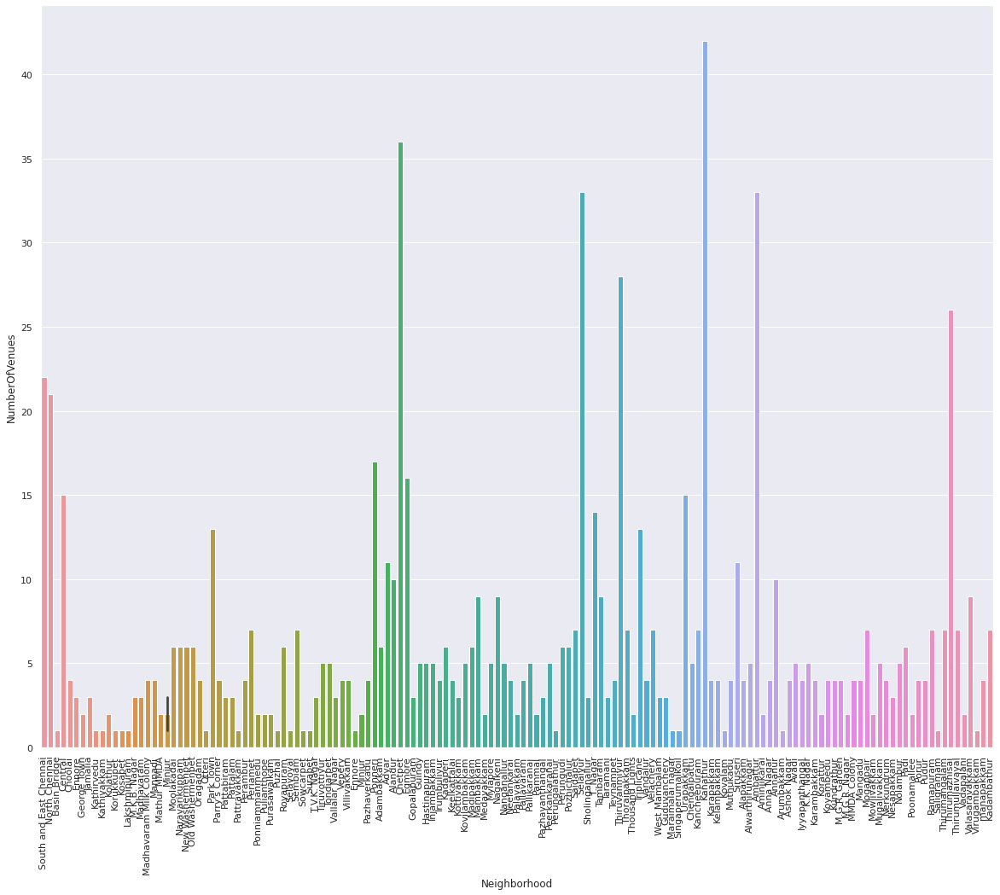

In [ ]:
import seaborn as sns
sns.set(rc={'figure.figsize':(20,16)})
plot = sns.barplot(x='Neighborhood',y='NumberOfVenues',data=individual_Chennai_venue_count)
plot.set_xticklabels(individual_Chennai_venue_count['Neighborhood'],rotation=90)

From the above graph we can see that inderanagar has most number of venues and soo on...

**Exploring Whitefield venues**

In [ ]:
Chennai_venues[Chennai_venues['Neighborhood']=='Porur']

,Neighborhood,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
519,Porur,West Chennai,13.0382,80.1565,Ratna Cafe,13.036111,80.153758,Indian Restaurant
520,Porur,West Chennai,13.0382,80.1565,Hotel Chennai Le Palace,13.036380,80.157143,Asian Restaurant
521,Porur,West Chennai,13.0382,80.1565,Copper Kitchen,13.036313,80.157232,Indian Restaurant
522,Porur,West Chennai,13.0382,80.1565,Porur Signal,13.035001,80.155601,Travel & Transport
523,Porur,West Chennai,13.0382,80.1565,Nandhini Sweets,13.035153,80.154974,Asian Restaurant
524,Porur,West Chennai,13.0382,80.1565,Porur Market,13.034652,80.156883,Flea Market


**One hot encoding for letting us to compare different venues based on some common scale**

In [ ]:
Chennai_venues_onehot = pd.get_dummies(Chennai_venues[['Venue Category']])

In [ ]:
Chennai_venues_onehot

,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian Restaurant,Venue Category_Sandwich Place,Venue Category_Scenic Lookout,Venue Category_Sculpture Garden,Venue Category_Seafood Restaurant,Venue Category_Shoe Store,Venue Category_Shopping Mall,Venue Category_Smoke Shop,Venue Category_Snack Pl

In [ ]:
Chennai_venues_onehot['Neighborhood'] = Chennai_venues['Neighborhood']
Chennai_venues_grouped = Chennai_venues_onehot.groupby('Neighborhood').mean().reset_index()
Chennai_venues_grouped

,Neighborhood,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian Restaurant,Venue Category_Sandwich Place,Venue Category_Scenic Lookout,Venue Category_Sculpture Garden,Venue Category_Seafood Restaurant,Venue Category_Shoe Store,Venue Category_Shopping Mall,Venue Category_Smoke Shop,Venue Cate

In [ ]:
number_of_top_venues = 5

In [ ]:
for hood in Chennai_venues_grouped['Neighborhood']:
    print('---------',hood,'---------')
    temp = Chennai_venues_grouped[Chennai_venues_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['Venue','Frequency']
    temp = temp.iloc[1:]
    temp['Frequency'] = temp['Frequency'].astype(float)
    temp = temp.round({'Frequency': 2})
    print(temp.sort_values('Frequency', ascending=False).reset_index(drop=True).head(number_of_top_venues))
    print('\n')

--------- Adambakkam ---------
                              Venue  Frequency
0     Venue Category_Ice Cream Shop       0.25
1  Venue Category_Indian Restaurant       0.25
2   Venue Category_Department Store       0.25
3       Venue Category_Dessert Shop       0.25
4          Venue Category_Nightclub       0.00


--------- Adyar ---------
                                 Venue  Frequency
0     Venue Category_Indian Restaurant       0.29
1           Venue Category_Pizza Place       0.18
2                  Venue Category_Café       0.12
3  Venue Category_Fast Food Restaurant       0.06
4                Venue Category_Arcade       0.06


--------- Alandur ---------
                              Venue  Frequency
0  Venue Category_Indian Restaurant       0.33
1      Venue Category_Metro Station       0.17
2      Venue Category_Train Station       0.17
3     Venue Category_Breakfast Spot       0.17
4   Venue Category_Kebab Restaurant       0.17


--------- Alapakkam ---------
               

Frequency of each neighborhood and its top 5 venues can be known. This is very important is we can analyze top neighborhoods with most busy restaurants

In [ ]:
def return_most_common_venues(row, number_of_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:number_of_top_venues]

In [ ]:
number_of_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(number_of_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Chennai_venues_grouped['Neighborhood']

for ind in np.arange(Chennai_venues_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Chennai_venues_grouped.iloc[ind, :], number_of_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Adambakkam,Venue Category_Ice Cream Shop,Venue Category_Indian Restaurant,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Women's Store,Venue Category_Electronics Store,Venue Category_Fishing Store,Venue Category_Fish Market,Venue Category_Fast Food Restaurant,Venue Category_Farmers Market
1,Adyar,Venue Category_Indian Restaurant,Venue Category_Pizza Place,Venue Category_Café,Venue Category_Juice Bar,Venue Category_Sandwich Place,Venue Category_Middle Eastern Restaurant,Venue Category_Fast Food Restaurant,Venue Category_Arcade,Venue Category_Asian Restaurant,Venue Category_Electronics Store
2,Alandur,Venue Category_Indian Restaurant,Venue Category_Train Station,Venue Category_Breakfast Spot,Venue Category_Kebab Restaurant,Venue Category_Metro Station,Venue Category_Women's Store,Venue Category_Event Space,Venue Category_Fishing Store,Venue Category_Fish Market,Venue Category_Fast Food Restaurant
3,Alapakkam,Venue Category_Indian Restaurant,Venue Category_Fast Food Restaurant,Venue Category_Women's Store,Venue Category_Dog Run,Venue Category_Fishing Store,Venue Category_Fish Market,Venue Category_Farmers Market,Venue Category_Farm,Venue Category_Event Space,Venue Category_Electronics Store
4,Alwarthirunagar,Venue Category_Clothing Store,Venue Category_Fast Food Restaurant,Venue Category_Vegetarian / Vegan Restaurant,Venue Category_Ice Cream Shop,Venue Category_Indian Restaurant,Venue Category_Pizza Place,Venue Category_Café,Venue Category_Gym,Venue Category_Diner,Venue Category_Farmers Market


In [ ]:
neighborhoods_venues_sorted.shape

(147, 11)

**Next challenge is to find the optimal k value for clustering and we do it using the elbow method**

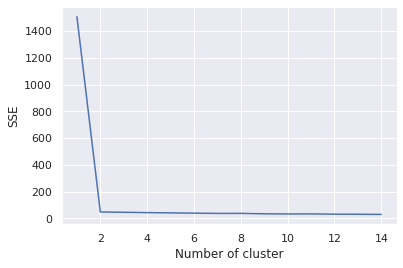

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
sse = {}
for k in range(1,15):
    kmeans = KMeans(n_clusters=k,random_state=0)
    kmeans.fit(Chennai_venues_grouped.drop('Neighborhood',axis=1))
    Chennai_venues_grouped['Cluster'] = kmeans.labels_
    sse[k] = kmeans.inertia_

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

**From the above graph, we can see the optimal value for cluster is 5.**

In [ ]:
kmeans = KMeans(n_clusters=5,random_state=0)

In [ ]:
kmeans.fit(Chennai_venues_grouped.drop('Neighborhood',axis=1))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [ ]:
Chennai_venues_grouped['Cluster'] = kmeans.labels_

In [ ]:
Chennai_venues_grouped.groupby('Cluster')['Neighborhood'].count()

Cluster
0    66
1    15
2    51
3    11
4     4
Name: Neighborhood, dtype: int64

In [ ]:
Chennai_venues_grouped.columns

Index(['Neighborhood', 'Venue Category_ATM',
       'Venue Category_Afghan Restaurant', 'Venue Category_African Restaurant',
       'Venue Category_American Restaurant', 'Venue Category_Arcade',
       'Venue Category_Art Gallery', 'Venue Category_Art Museum',
       'Venue Category_Arts & Crafts Store', 'Venue Category_Asian Restaurant',
       ...
       'Venue Category_Theater', 'Venue Category_Theme Park',
       'Venue Category_Train', 'Venue Category_Train Station',
       'Venue Category_Travel & Transport',
       'Venue Category_Vegetarian / Vegan Restaurant',
       'Venue Category_Video Store', 'Venue Category_Whisky Bar',
       'Venue Category_Women's Store', 'Cluster'],
      dtype='object', length=158)

In [ ]:
neighborhoods_venues_sorted = neighborhoods_venues_sorted.merge(Chennai_venues_grouped,on='Neighborhood')

In [ ]:
neighborhoods_venues_sorted.head(4)

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian Restaur

In [ ]:
neighborhoods_venues_sorted.columns
neighborhoods_venues_sorted = neighborhoods_venues_sorted.merge(Chennai_venues,on='Neighborhood')

In [ ]:
# create map
map_clusters = folium.Map(location=[Chennai_latitude, Chennai_longitude], zoom_start=11)

In [ ]:
# set color scheme for the clusters
x = np.arange(6)
ys = [i + x + (i*x)**2 for i in range(6)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(neighborhoods_venues_sorted['Neighborhood Latitude'], neighborhoods_venues_sorted['Neighborhood Longitude'], neighborhoods_venues_sorted['Neighborhood'], neighborhoods_venues_sorted['Cluster']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)

**Finding similar locations based on user input (recommending location)**

**We need to analyze factors such as population and Income to recommend.**

In [ ]:
Chennai_income.head()

,Borough,Neighborhoods,AverageIncome
0,South and East Chennai,Adambakkam,18944.099792
1,South and East Chennai,Adyar,56837.022198
2,South and East Chennai,Alandur,41991.817435
3,West Chennai,Alapakkam,6667.447632
4,West Chennai,Alwarthirunagar,53270.063892


In [ ]:
Chennai_population.head()

,Borough,Neighborhoods,Population
0,South and East Chennai,Adambakkam,82848
1,South and East Chennai,Adyar,147143
2,South and East Chennai,Alandur,47983
3,West Chennai,Alapakkam,527874
4,West Chennai,Alwarthirunagar,893629


In [ ]:
Chennai_population['Normalized_population'] = Chennai_population['Population']/Chennai_population['Population'].max(axis=0)
Chennai_population.head()

,Borough,Neighborhoods,Population,Normalized_population
0,South and East Chennai,Adambakkam,82848,0.084421
1,South and East Chennai,Adyar,147143,0.149938
2,South and East Chennai,Alandur,47983,0.048894
3,West Chennai,Alapakkam,527874,0.537899
4,West Chennai,Alwarthirunagar,893629,0.910601


In [ ]:
Chennai_income['Normalized_income'] = Chennai_income['AverageIncome']/Chennai_income['AverageIncome'].max(axis=0)
Chennai_income.head()

,Borough,Neighborhoods,AverageIncome,Normalized_income
0,South and East Chennai,Adambakkam,18944.099792,0.293051
1,South and East Chennai,Adyar,56837.022198,0.879225
2,South and East Chennai,Alandur,41991.817435,0.649581
3,West Chennai,Alapakkam,6667.447632,0.103140
4,West Chennai,Alwarthirunagar,53270.063892,0.824047


In [ ]:
Chennai_venues_grouped.head(1)

,Neighborhood,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian Restaurant,Venue Category_Sandwich Place,Venue Category_Scenic Lookout,Venue Category_Sculpture Garden,Venue Category_Seafood Restaurant,Venue Category_Shoe Store,Venue Category_Shopping Mall,Venue Category_Smoke Shop,Venue Cate

**Recommending Veg restaurants**

In [ ]:
Chennai_veg = Chennai_venues_onehot.groupby(['Neighborhood']).sum().reset_index()
Chennai_veg.head()

,Neighborhood,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian Restaurant,Venue Category_Sandwich Place,Venue Category_Scenic Lookout,Venue Category_Sculpture Garden,Venue Category_Seafood Restaurant,Venue Category_Shoe Store,Venue Category_Shopping Mall,Venue Category_Smoke Shop,Venue Cate

In [ ]:
Chennai_veg['Venue Category_Vegetarian / Vegan Restaurant']

0      0
1      0
2      0
3      0
4      1
5      0
6      0
7      2
8      0
9      0
10     1
11     0
12     0
13     1
14     0
15     0
16     0
17     1
18     0
19     0
20     0
21     0
22     1
23     0
24     0
25     0
26     0
27     0
28     0
29     0
30     0
31     0
32     1
33     0
34     1
35     0
36     0
37     0
38     0
39     0
40     0
41     0
42     0
43     0
44     0
45     0
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     1
63     0
64     0
65     0
66     0
67     1
68     0
69     1
70     0
71     0
72     0
73     0
74     0
75     0
76     2
77     0
78     1
79     2
80     0
81     0
82     0
83     0
84     1
85     0
86     0
87     1
88     0
89     0
90     0
91     0
92     0
93     0
94     0
95     0
96     1
97     0
98     0
99     0
100    0
101    0
102    0
103    0
104    0
105    0
106    0
107    0
108    0
109    0
110    0
1

In [ ]:
Chennai_veg = Chennai_veg[['Neighborhood','Venue Category_Vegetarian / Vegan Restaurant']]

In [ ]:
Chennai_veg.rename(columns={'Venue Category_Vegetarian / Vegan Restaurant':'NumberOfVegRestaurants'},inplace=True)

In [ ]:
Chennai_veg.head()

,Neighborhood,NumberOfVegRestaurants
0,Adambakkam,0
1,Adyar,0
2,Alandur,0
3,Alapakkam,0
4,Alwarthirunagar,1


In [ ]:
Chennai_veg['NumberOfNonVeganrestaurants'] = 1-(Chennai_veg['NumberOfVegRestaurants']/Chennai_veg['NumberOfVegRestaurants'].max(axis=0))

In [ ]:
Chennai_veg.head(10)

,Neighborhood,NumberOfVegRestaurants,NumberOfNonVeganrestaurants
0,Adambakkam,0,1.0
1,Adyar,0,1.0
2,Alandur,0,1.0
3,Alapakkam,0,1.0
4,Alwarthirunagar,1,0.5
5,Ambattur,0,1.0
6,Aminjikarai,0,1.0
7,Anna Nagar,2,0.0
8,Annanur,0,1.0
9,Arumbakkam,0,1.0


In [ ]:
Chennai_veg.rename(columns={'Neighborhood':'Neighborhoods'},inplace=True)

**Building a target neighborhood by providing a sample restaurant : say ' West Chennai '**

In [ ]:
target_cluster_dataframe = neighborhoods_venues_sorted.loc[neighborhoods_venues_sorted['Neighborhood']=='Porur']

In [ ]:
target_cluster_dataframe.reset_index()

,index,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian R

In [ ]:
target_cluster = target_cluster_dataframe.iloc[0].at['Cluster']

In [ ]:
target_cluster

2

In [ ]:
print("The target cluster is : ",target_cluster)

The target cluster is :  2


In [ ]:
possible_neighborhoods = neighborhoods_venues_sorted[neighborhoods_venues_sorted['Cluster']==target_cluster]
possible_neighborhoods.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian Restaur

In [ ]:
print("There are {} neighborhoods which has similar characteristics to Whitefield.".format(possible_neighborhoods.shape[0]))

There are 458 neighborhoods which has similar characteristics to Whitefield.


In [ ]:
possible_neighborhoods.reset_index().head()

,index,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian R

In [ ]:
possible_neighborhoods.rename(columns={'Neighborhood':'Neighborhoods'},inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


**Now we need to create ranking by combining population and income factors as well?**

In [ ]:
possible_neighborhoods = possible_neighborhoods.merge(Chennai_population[['Neighborhoods','Population','Normalized_population']],on='Neighborhoods')
possible_neighborhoods = possible_neighborhoods.merge(Chennai_income[['Neighborhoods','AverageIncome','Normalized_income']],on='Neighborhoods')
possible_neighborhoods = possible_neighborhoods.merge(Chennai_veg[['Neighborhoods','NumberOfVegRestaurants','NumberOfNonVeganrestaurants']],on='Neighborhoods')

In [ ]:
possible_neighborhoods.head()

,Neighborhoods,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian Restau

In [ ]:
possible_neighborhoods['Ranking'] = possible_neighborhoods['Normalized_population'] * 0.5 + possible_neighborhoods['Normalized_income'] * 0.35 + possible_neighborhoods['NumberOfNonVeganrestaurants'] * 0.1
recommended_neighborhoods = possible_neighborhoods.sort_values(by='Ranking',ascending=False)
recommended_neighborhoods.reset_index(inplace=True, drop=True)

In [ ]:
recommended_neighborhoods.head()

,Neighborhoods,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Venue Category_ATM,Venue Category_Afghan Restaurant,Venue Category_African Restaurant,Venue Category_American Restaurant,Venue Category_Arcade,Venue Category_Art Gallery,Venue Category_Art Museum,Venue Category_Arts & Crafts Store,Venue Category_Asian Restaurant,Venue Category_Astrologer,Venue Category_Athletics & Sports,Venue Category_Auto Garage,Venue Category_Auto Workshop,Venue Category_BBQ Joint,Venue Category_Baby Store,Venue Category_Badminton Court,Venue Category_Bagel Shop,Venue Category_Bakery,Venue Category_Bank,Venue Category_Bar,Venue Category_Beach,Venue Category_Bike Rental / Bike Share,Venue Category_Bistro,Venue Category_Boarding House,Venue Category_Bookstore,Venue Category_Boutique,Venue Category_Bowling Alley,Venue Category_Breakfast Spot,Venue Category_Buffet,Venue Category_Burger Joint,Venue Category_Bus Station,Venue Category_Bus Stop,Venue Category_Cafeteria,Venue Category_Café,Venue Category_Chettinad Restaurant,Venue Category_Chinese Restaurant,Venue Category_Chocolate Shop,Venue Category_Clothing Store,Venue Category_Coffee Shop,Venue Category_Comfort Food Restaurant,Venue Category_Concert Hall,Venue Category_Construction & Landscaping,Venue Category_Convenience Store,Venue Category_Cosmetics Shop,Venue Category_Cricket Ground,Venue Category_Department Store,Venue Category_Dessert Shop,Venue Category_Diner,Venue Category_Dog Run,Venue Category_Electronics Store,Venue Category_Event Space,Venue Category_Farm,Venue Category_Farmers Market,Venue Category_Fast Food Restaurant,Venue Category_Fish Market,Venue Category_Fishing Store,Venue Category_Flea Market,Venue Category_Flower Shop,Venue Category_Food,Venue Category_Food & Drink Shop,Venue Category_Food Court,Venue Category_Food Truck,Venue Category_Fried Chicken Joint,Venue Category_Fruit & Vegetable Store,Venue Category_Furniture / Home Store,Venue Category_Gift Shop,Venue Category_Golf Course,Venue Category_Grocery Store,Venue Category_Gym,Venue Category_Gym / Fitness Center,Venue Category_Gym Pool,Venue Category_Halal Restaurant,Venue Category_Harbor / Marina,Venue Category_Health & Beauty Service,Venue Category_Historic Site,Venue Category_Hookah Bar,Venue Category_Hotel,Venue Category_Hyderabadi Restaurant,Venue Category_IT Services,Venue Category_Ice Cream Shop,Venue Category_Indian Chinese Restaurant,Venue Category_Indian Restaurant,Venue Category_Indian Sweet Shop,Venue Category_Indie Movie Theater,Venue Category_Italian Restaurant,Venue Category_Japanese Curry Restaurant,Venue Category_Jewelry Store,Venue Category_Juice Bar,Venue Category_Kebab Restaurant,Venue Category_Lake,Venue Category_Light Rail Station,Venue Category_Liquor Store,Venue Category_Lounge,Venue Category_Luggage Store,Venue Category_Market,Venue Category_Men's Store,Venue Category_Metro Station,Venue Category_Mexican Restaurant,Venue Category_Middle Eastern Restaurant,Venue Category_Miscellaneous Shop,Venue Category_Molecular Gastronomy Restaurant,Venue Category_Motel,Venue Category_Motorcycle Shop,Venue Category_Movie Theater,Venue Category_Moving Target,Venue Category_Multiplex,Venue Category_Museum,Venue Category_Music Store,Venue Category_Nightclub,Venue Category_North Indian Restaurant,Venue Category_Office,Venue Category_Organic Grocery,Venue Category_Outlet Store,Venue Category_Paper / Office Supplies Store,Venue Category_Park,Venue Category_Performing Arts Venue,Venue Category_Pet Store,Venue Category_Pharmacy,Venue Category_Pier,Venue Category_Pizza Place,Venue Category_Platform,Venue Category_Playground,Venue Category_Pool,Venue Category_Pool Hall,Venue Category_Portuguese Restaurant,Venue Category_Pub,Venue Category_Residential Building (Apartment / Condo),Venue Category_Resort,Venue Category_Restaurant,Venue Category_Russian Restau

In [ ]:
top3 = recommended_neighborhoods.groupby(['Neighborhoods','1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue'])['Ranking'].unique()

In [ ]:
top3_df = pd.DataFrame(top3).reset_index()

In [ ]:
top3_df.head(3)

,Neighborhoods,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,Ranking
0,Adambakkam,Venue Category_Ice Cream Shop,Venue Category_Indian Restaurant,Venue Category_Department Store,[0.2447784110101273]
1,Adyar,Venue Category_Indian Restaurant,Venue Category_Pizza Place,Venue Category_Café,[0.48269740096662883]
2,Alandur,Venue Category_Indian Restaurant,Venue Category_Train Station,Venue Category_Breakfast Spot,[0.35180044626827367]


Here, according the data, we see that 'Begur,Hulimavu and kamakshipalya' are top 3 neighborhoods to find similar food to whitefield restaurant's veg food ! Here our model will recommend these neighborneeds and top 3 common venues to visit. 
**Thank you for reviewing**